# Triple Spec Focus Calculator

In [14]:
data_path = '/home/simon/data/soar/tspec_focus/UT20201122'

## Show list of files in folder

In [15]:
import os
import glob

file_list = glob.glob(os.path.join(data_path, '*fits'))
for _file in file_list:
    print(_file)

/home/simon/data/soar/tspec_focus/UT20201122/SV_OBJ0015.fits
/home/simon/data/soar/tspec_focus/UT20201122/SV_OBJ0016.fits
/home/simon/data/soar/tspec_focus/UT20201122/SV_OBJ0012.fits
/home/simon/data/soar/tspec_focus/UT20201122/SV_OBJ0010.fits
/home/simon/data/soar/tspec_focus/UT20201122/SV_OBJ0011.fits
/home/simon/data/soar/tspec_focus/UT20201122/SV_OBJ0014.fits
/home/simon/data/soar/tspec_focus/UT20201122/SV_OBJ0013.fits


## Visualize the files

In [16]:
from ccdproc import CCDData
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from astropy.visualization import SqrtStretch, ZScaleInterval, MinMaxInterval

plt.style.use('dark_background')
def show_files(ccd):
#     ccd = CCDData.read(full_path,
#                        unit='adu')
#     scale = MinMaxInterval()
    scale = ZScaleInterval()
    z1, z2 = scale.get_limits(ccd.data)
    print(z1, z2)
#     norm = ImageNormalize(stretch=SqrtStretch())
    fig, ax = plt.subplots(figsize=(20,15))
    ax.set_title("{} {}".format(ccd.header['FILENAME'], ccd.header['TELFOCUS']))
    ax.imshow(ccd.data, clim=(z1, z2), cmap=cm.gray, origin='lower',
              interpolation='nearest')
    plt.show()
    
    plt.close()

0 681


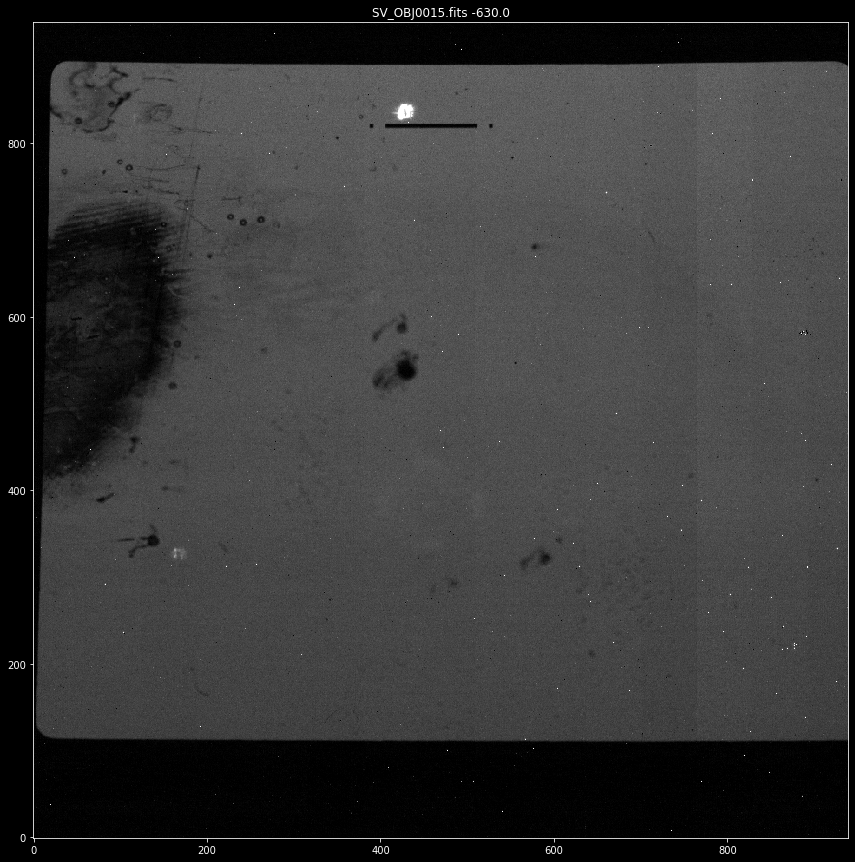

0 433


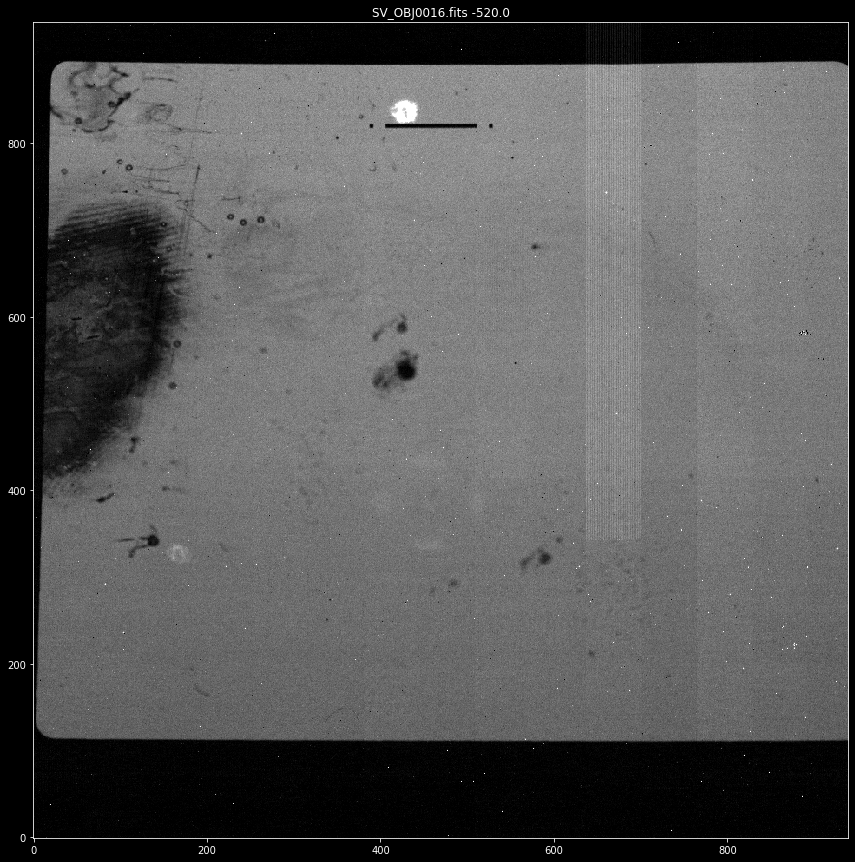

0 418


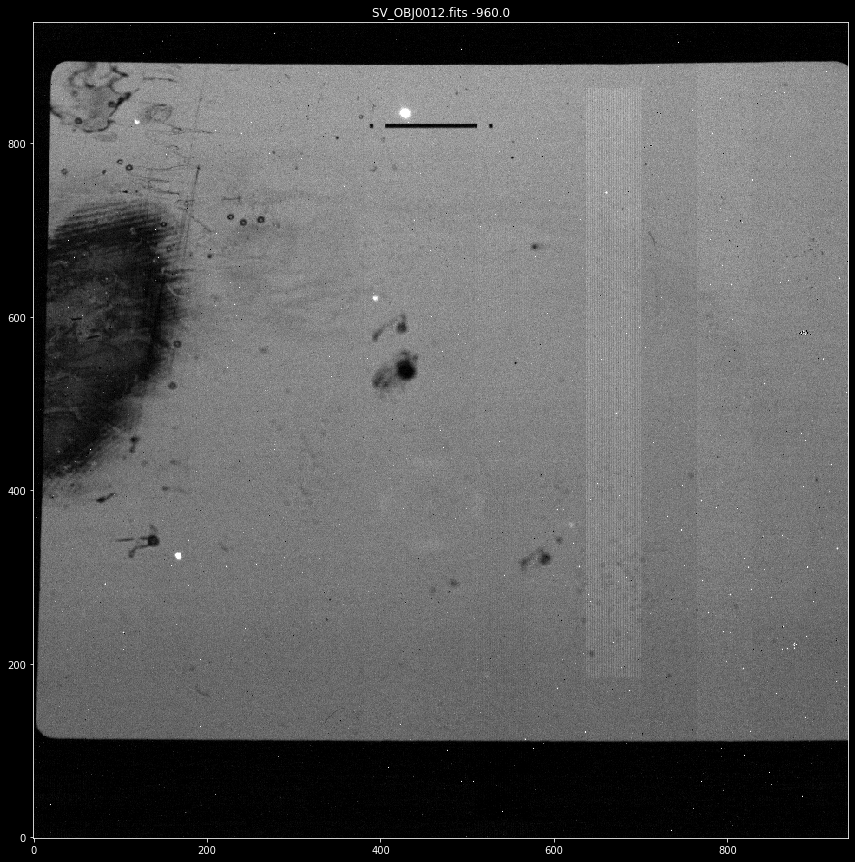

0 617


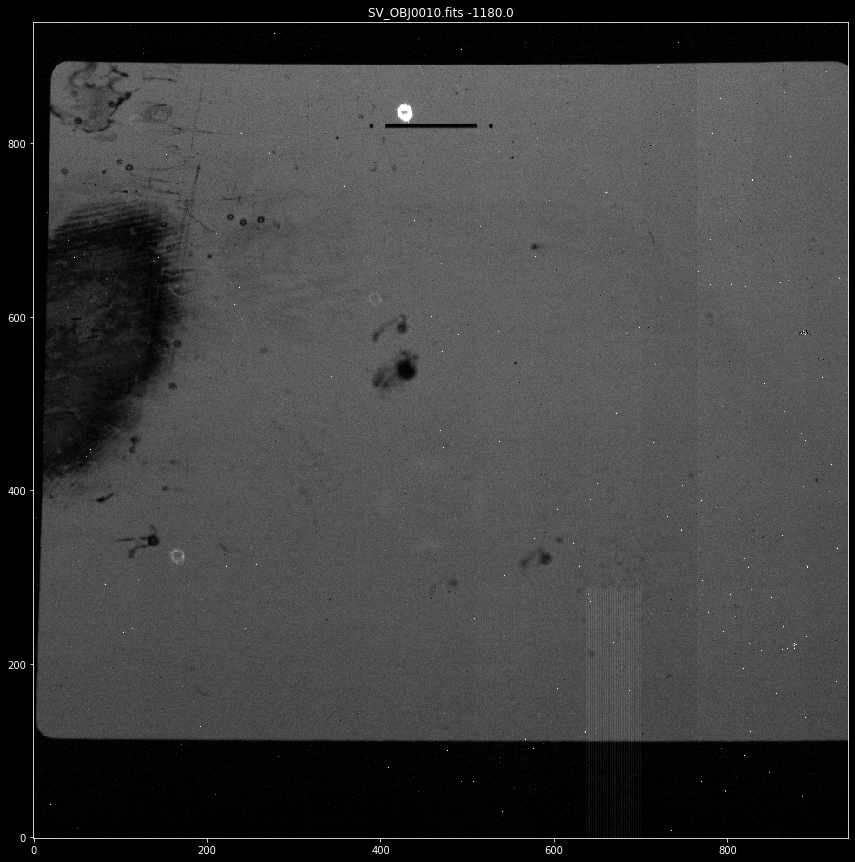

0 734.1784772608186


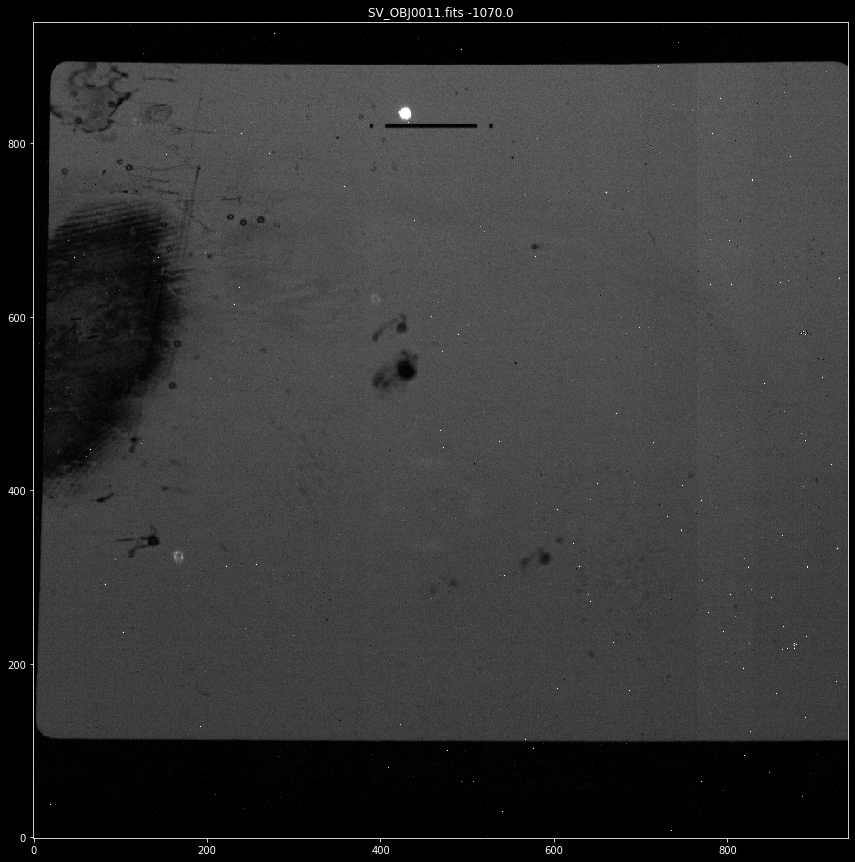

0 395


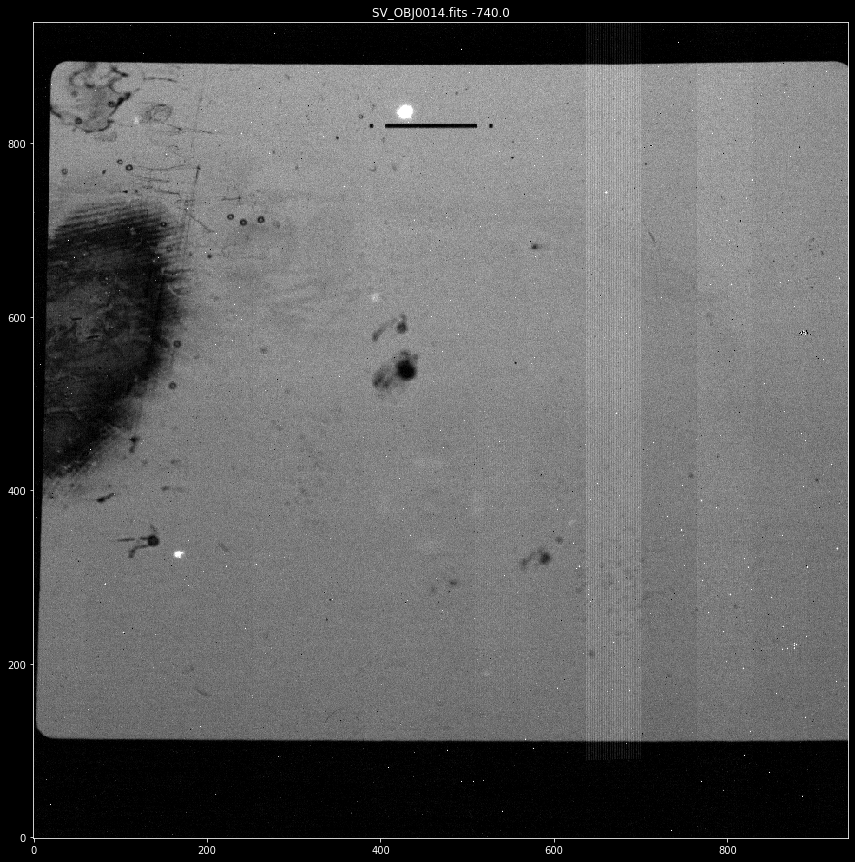

0 371


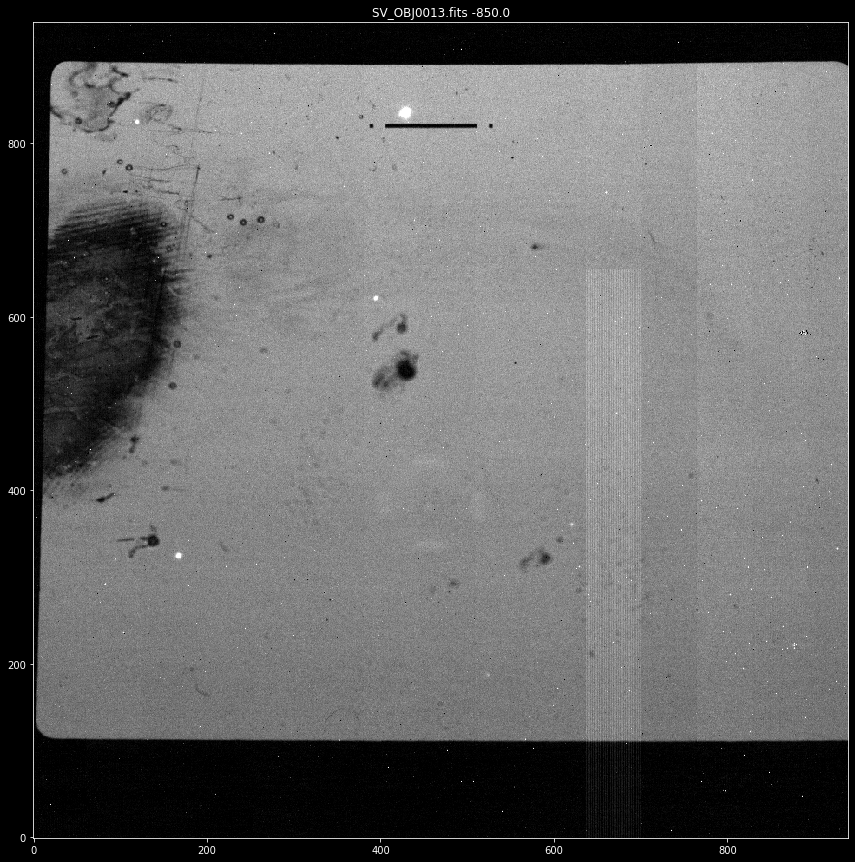

In [17]:
for _file in file_list:
    ccd = CCDData.read(_file, unit='adu')
    show_files(ccd)

Black surronding regions will be trimmed out

## Create a Prototype

Add functionalities and as the code gets bigger I identify parts of the code that can be converted into functions or methods.

In [18]:
from ccdproc import ccdmask
from ccdproc import trim_image
from astropy.stats import sigma_clipped_stats
from photutils import DAOStarFinder
from photutils import CircularAperture
from mpl_toolkits.axes_grid1 import make_axes_locatable
import pandas as pd
import copy
import numpy as np
import glob

Processing file: /home/simon/data/soar/tspec_focus/UT20201122/SV_OBJ0010.fits
211.3637778714543 211.0 26.359768378068615


Unable to detect sources in file: SV_OBJ0010.fits
Processing file: /home/simon/data/soar/tspec_focus/UT20201122/SV_OBJ0011.fits
209.5115685430611 208.0 28.517881618742468
 id xcentroid ycentroid sharpness   roundness1  roundness2 npix sky peak    flux      mag     focus     filename   
--- --------- --------- ---------- ------------ ---------- ---- --- ---- --------- ---------- ----- ---------------
  1 404.39943 720.88247 0.36326454 -0.027821971 0.49106748  169   0 1776 14.339508 -2.8913356 -1070 SV_OBJ0011.fits
[[404.39942924 720.88246647]]
Processing file: /home/simon/data/soar/tspec_focus/UT20201122/SV_OBJ0012.fits
207.71980762247765 208.0 30.47598237103978


 id xcentroid ycentroid sharpness   roundness1  roundness2  npix sky peak    flux      mag     focus     filename   
--- --------- --------- ---------- ----------- ------------ ---- --- ---- --------- ---------- ----- ---------------
  1 406.11898 720.73619 0.72656557 -0.16036008 -0.085463679  169   0 7950 55.387695 -4.3585332  -960 SV_OBJ0012.fits
[[406.11897935 720.73619303]]
Processing file: /home/simon/data/soar/tspec_focus/UT20201122/SV_OBJ0013.fits
206.53877139231705 206.0 28.051884528217297


 id xcentroid ycentroid sharpness  roundness1  roundness2 npix sky  peak    flux      mag     focus     filename   
--- --------- --------- ---------- ---------- ----------- ---- --- ----- --------- ---------- ----- ---------------
  1 406.87142 720.88865 0.99431333 0.15083005 0.048217948  169   0 10140 56.563733 -4.3813452  -850 SV_OBJ0013.fits
[[406.87142355 720.88864919]]
Processing file: /home/simon/data/soar/tspec_focus/UT20201122/SV_OBJ0014.fits
202.81347923919947 201.0 27.84069560347574


 id xcentroid ycentroid sharpness  roundness1 roundness2 npix sky peak    flux      mag     focus     filename   
--- --------- --------- ---------- ---------- ---------- ---- --- ---- --------- ---------- ----- ---------------
  1  405.6888 722.14257 0.61487614 0.51354571 0.69414684  169   0 2893 18.196904 -3.1499938  -740 SV_OBJ0014.fits
[[405.6887961  722.14257027]]
Processing file: /home/simon/data/soar/tspec_focus/UT20201122/SV_OBJ0015.fits
204.6393004788389 203.0 27.00652269436294


 id xcentroid ycentroid sharpness  roundness1  roundness2 npix sky peak    flux      mag     focus     filename   
--- --------- --------- ---------- ---------- ----------- ---- --- ---- --------- ---------- ----- ---------------
  1 404.03914 726.12966 0.59460928 0.30430245 -0.20503651  169   0 1138 6.8572761 -2.0903791  -630 SV_OBJ0015.fits
[[404.03914112 726.12965963]]
Processing file: /home/simon/data/soar/tspec_focus/UT20201122/SV_OBJ0016.fits
203.82824878930572 204.0 27.549228757233344


 id xcentroid ycentroid sharpness   roundness1 roundness2 npix sky peak    flux      mag     focus     filename   
--- --------- --------- ---------- ----------- ---------- ---- --- ---- --------- ---------- ----- ---------------
  1 401.04703 716.35227 0.57440931 -0.53761104 0.42451579  169   0  632 3.5280944 -1.3688505  -520 SV_OBJ0016.fits
[[401.04703241 716.35226879]]
   id   xcentroid   ycentroid  sharpness  roundness1  roundness2  npix  sky  \
0   1  404.399429  720.882466   0.363265   -0.027822    0.491067   169  0.0   
0   1  406.118979  720.736193   0.726566   -0.160360   -0.085464   169  0.0   
0   1  406.871424  720.888649   0.994313    0.150830    0.048218   169  0.0   
0   1  405.688796  722.142570   0.614876    0.513546    0.694147   169  0.0   
0   1  404.039141  726.129660   0.594609    0.304302   -0.205037   169  0.0   
0   1  401.047032  716.352269   0.574409   -0.537611    0.424516   169  0.0   

      peak       flux       mag   focus         filename  
0   1776.0  

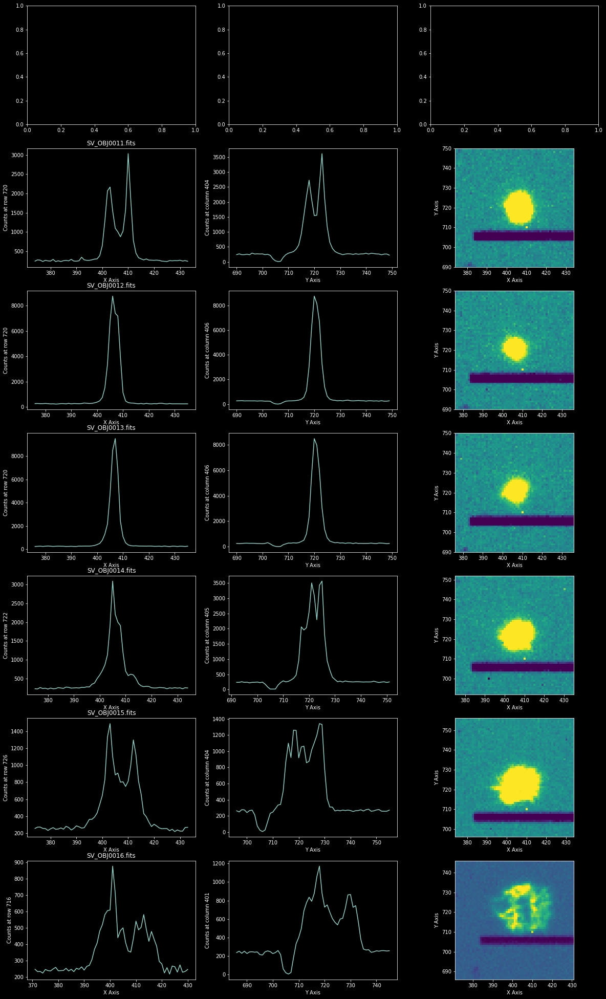

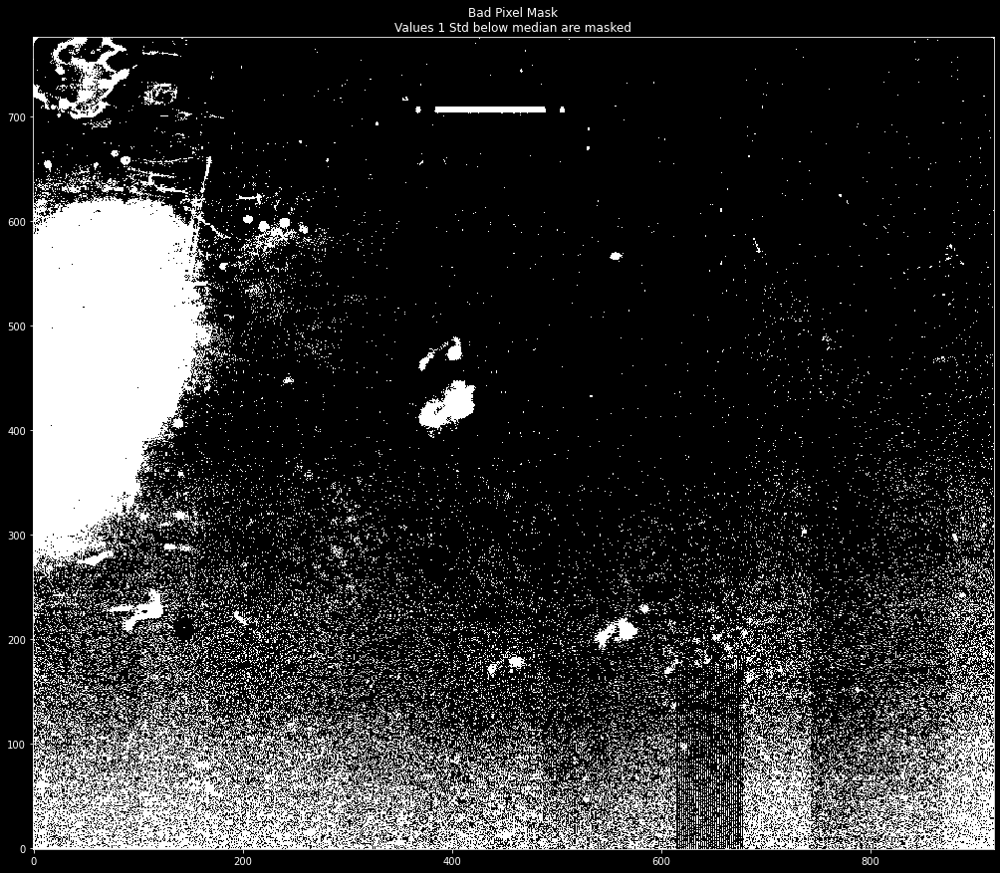

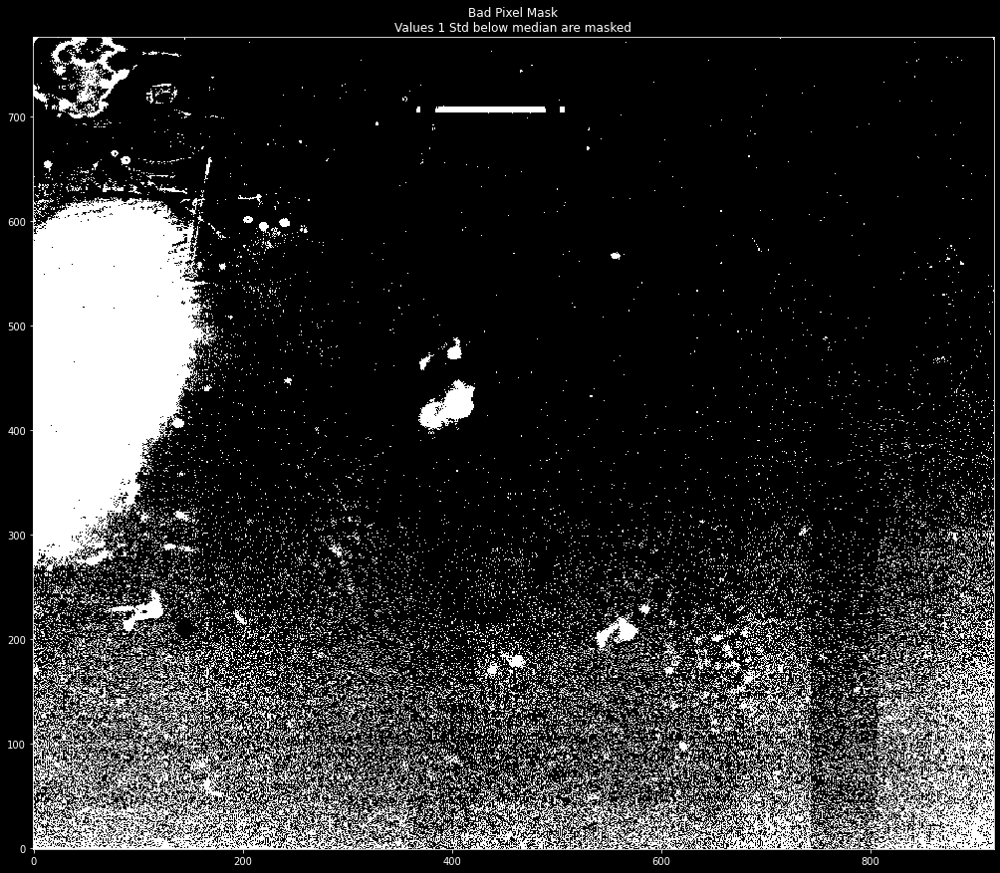

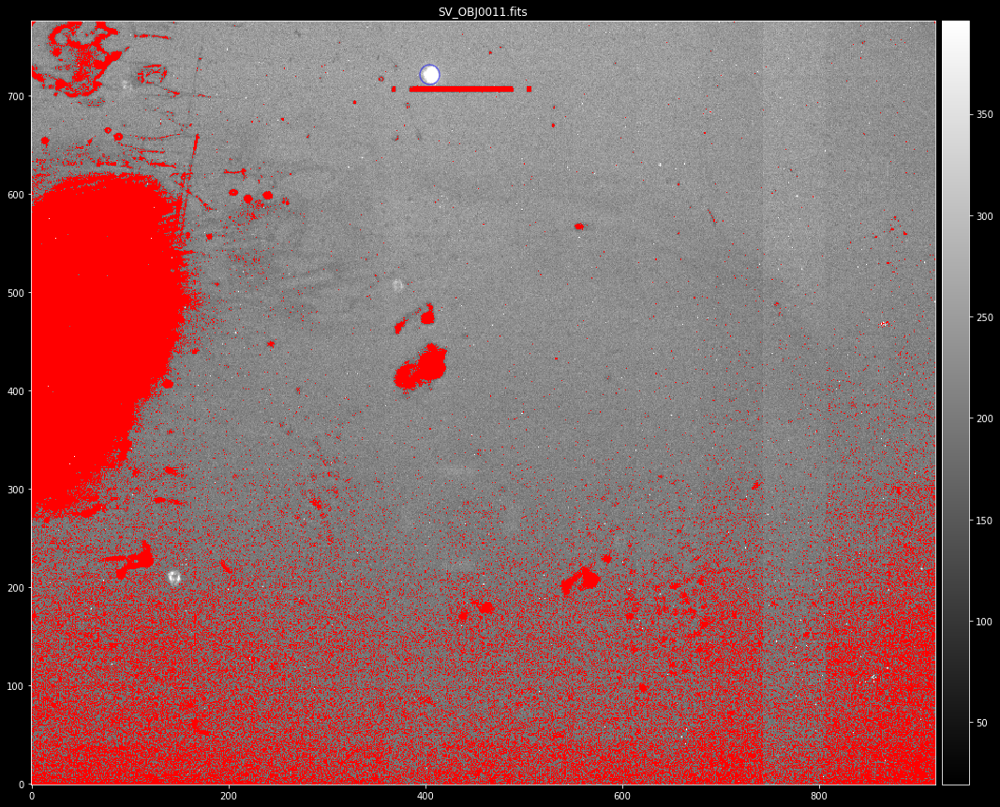

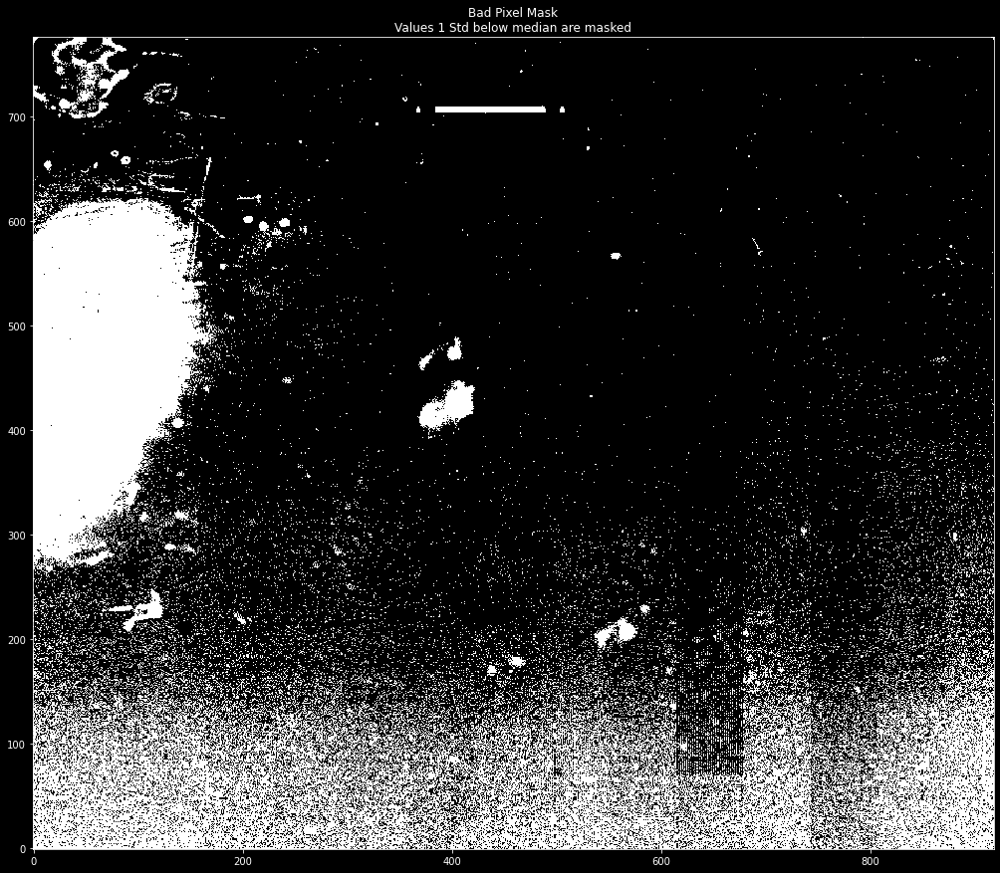

...

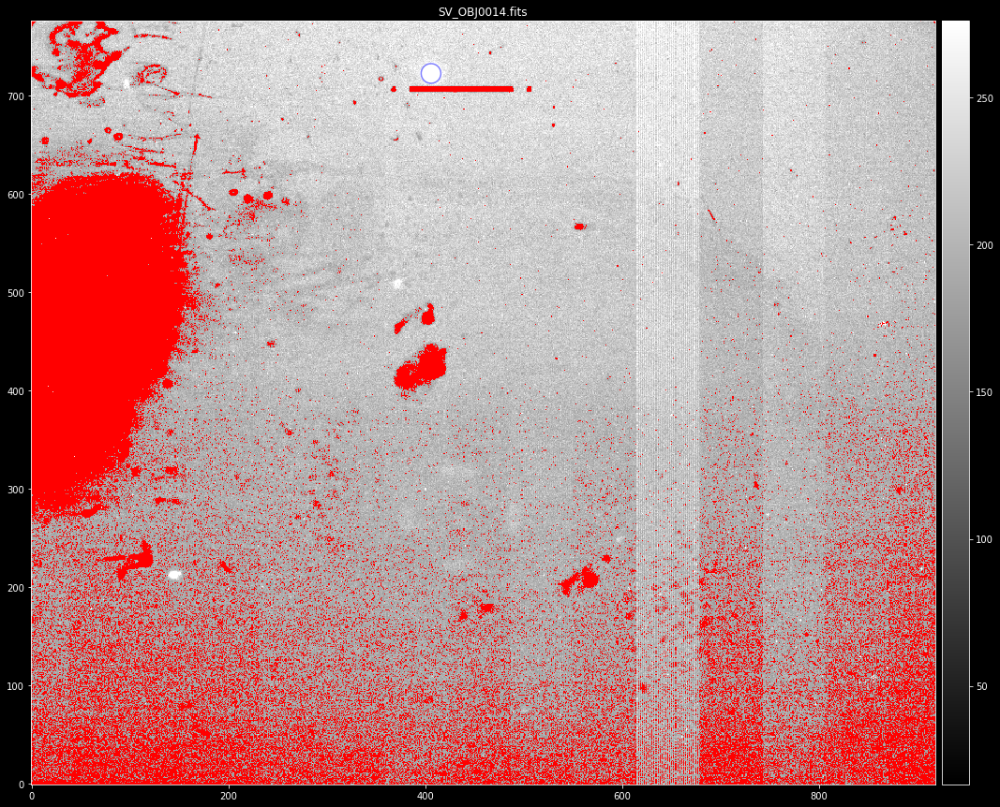

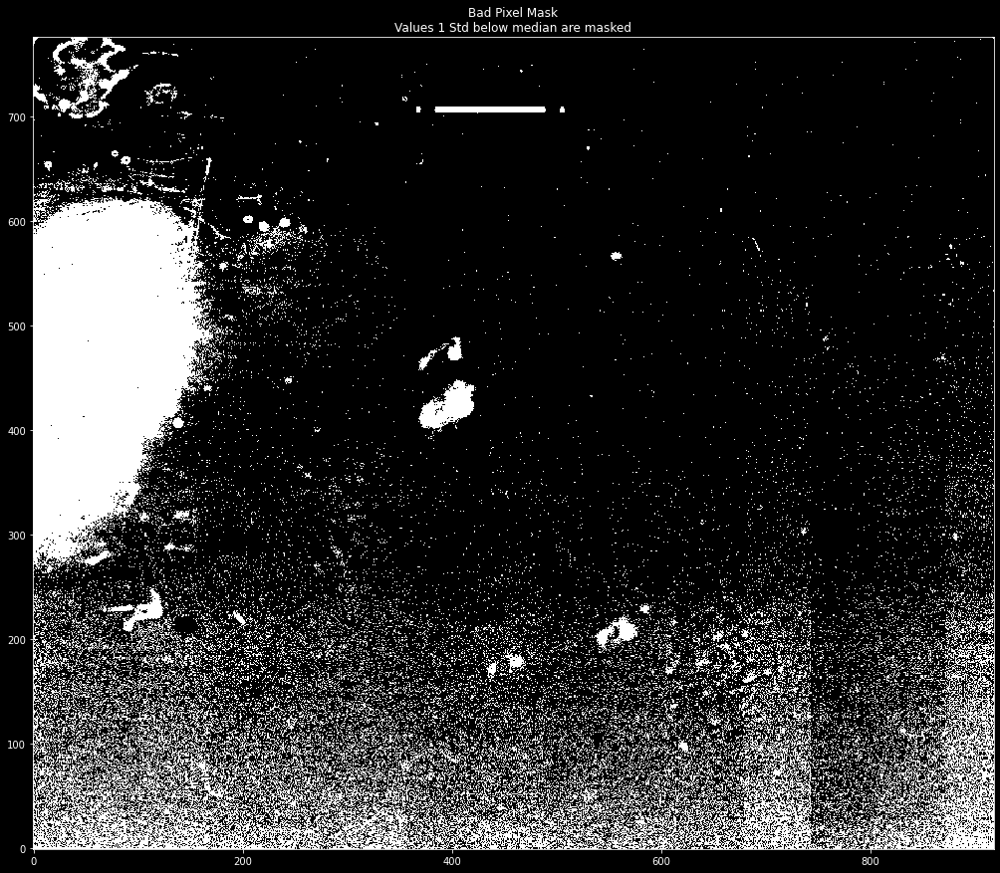

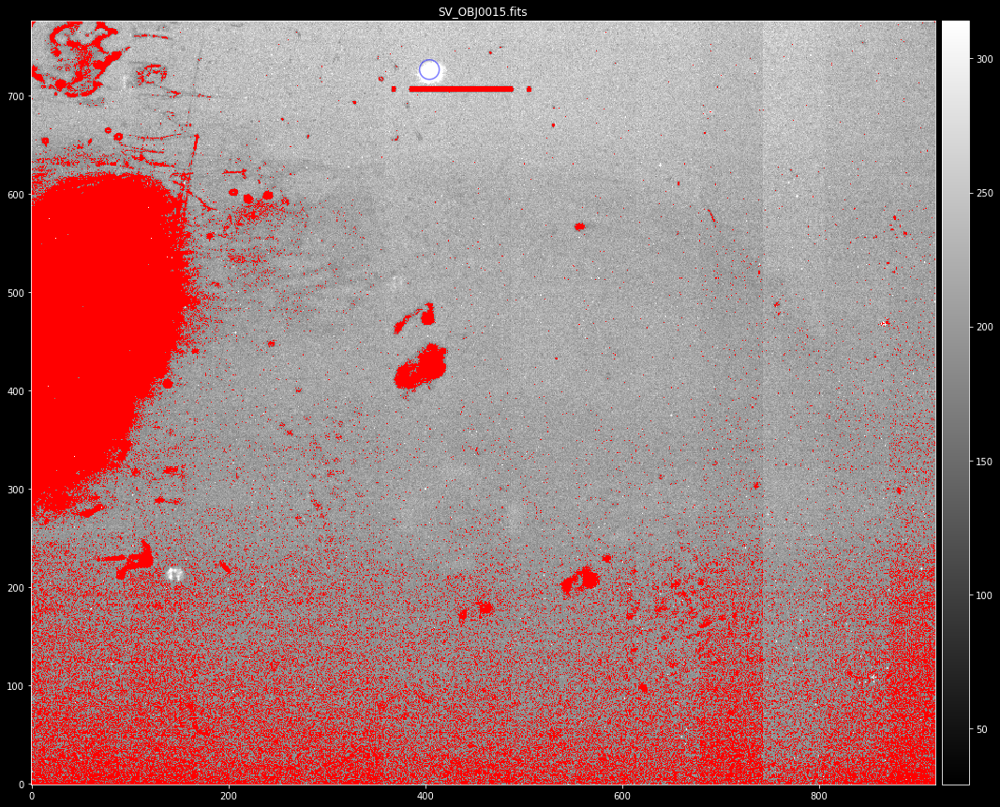

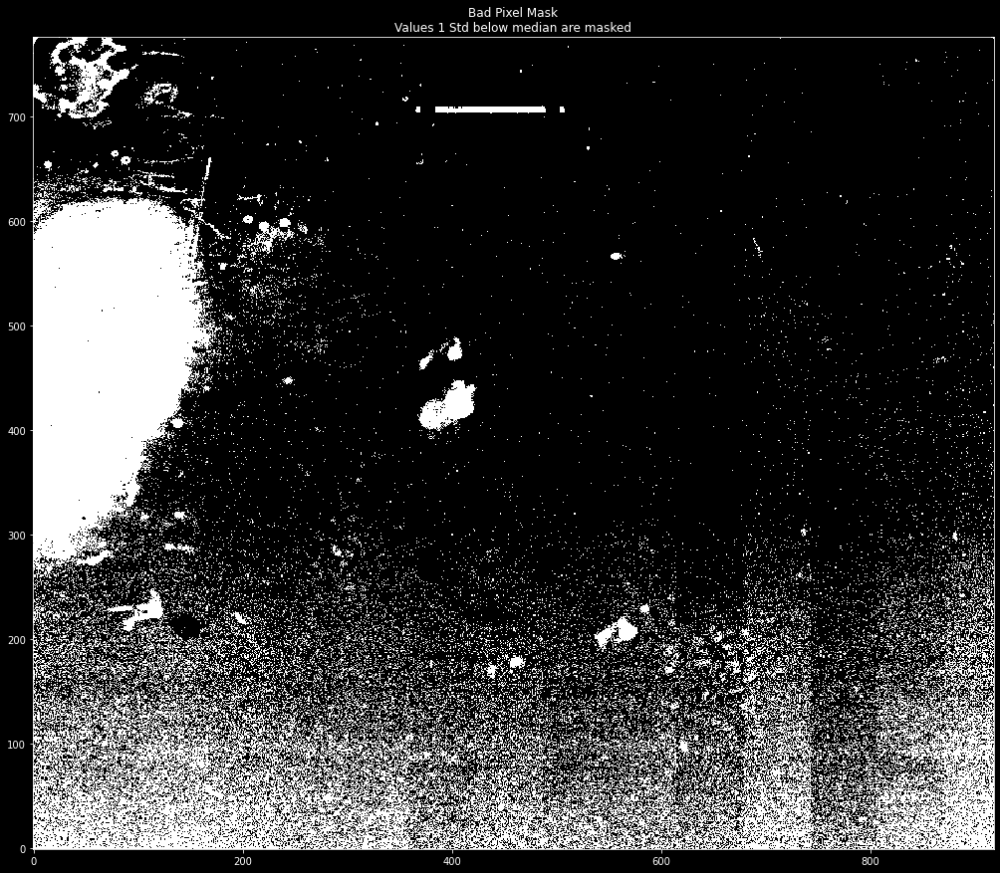

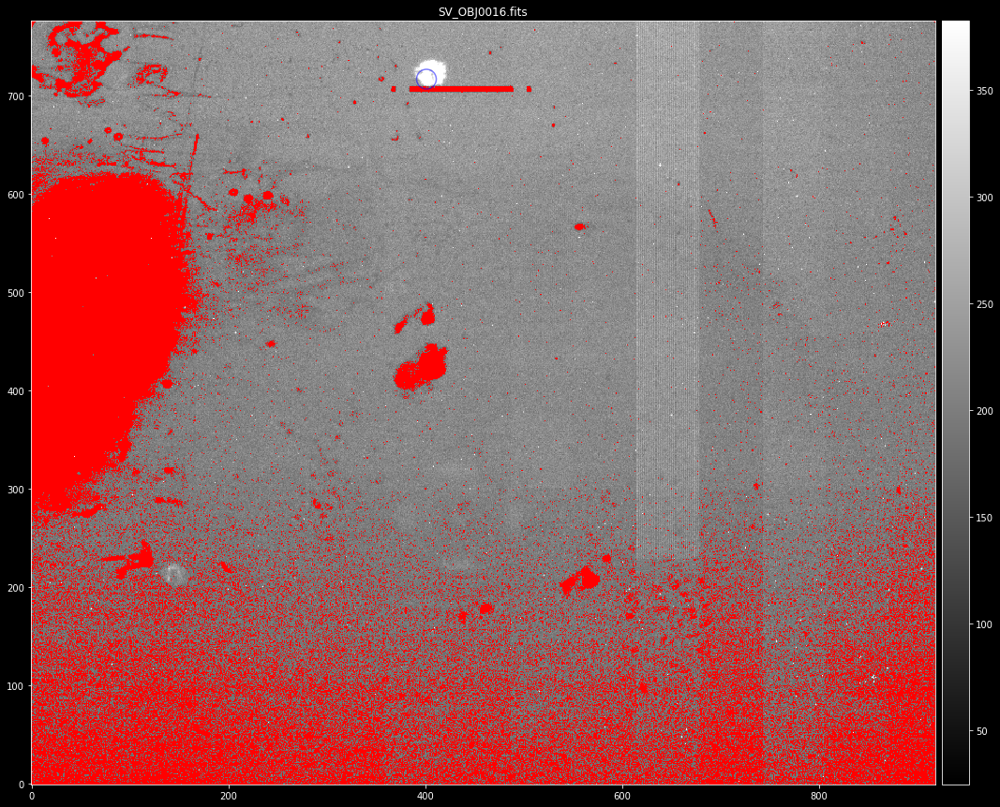

In [19]:
class TripleSpecFocus(object):
    
    def __init__(self):
        self.fig = None
        self.valid_sources = None
        
    def __call__(self, 
                 data_path, 
                 source_fwhm=10.0,
                 det_threshold=5.0, 
                 mask_threshold=1,
                 trim_section='[23:940,115:890]',
                 brightest=1,
                 show_mask=False):
        self.source_fwhm = source_fwhm
        self.det_threshold = det_threshold
        self.mask_threshold = mask_threshold
        self.trim_section = trim_section
        self.brightest = brightest
        self.show_mask = show_mask
        self.valid_sources = []
        
        file_list = sorted(glob.glob(os.path.join(data_path, '*.fits')))
        
        self.fig, self.axes = plt.subplots(len(file_list), 3, figsize=(20, 5 * len(file_list)))
        
        for self.i in range(len(file_list)):
            print("Processing file: {}".format(file_list[self.i]))
            ccd = CCDData.read(file_list[self.i], unit='adu')
            #     print(ccd.data.shape)
            sources = self.detect_sources(ccd)
            if sources is not None:
                self.valid_sources.append(sources)
                
        pd_sources = self._sources_to_pandas()
        print(pd_sources)
                
    def _sources_to_pandas(self):
        all_pandas_sources = []
        for source in self.valid_sources:
            pd_source = source.to_pandas()
            all_pandas_sources.append(pd_source)
        pd_sources = pd.concat(all_pandas_sources)
            
        return pd_sources
        
    def detect_sources(self, ccd):
        ccd = trim_image(ccd, fits_section=self.trim_section)
        #     print(ccd.data.shape)
        ccd.write(os.path.join(data_path, 'trimmed', ccd.header['FILENAME']), overwrite=True)
        #     show_files(ccd)
        mean, median, std = sigma_clipped_stats(ccd.data, sigma=3.0)
        print(mean, median, std)

        ccd.mask = ccd.data <= (median - self.mask_threshold * std)
        #     ccd.mask = ccdmask(ccd, byblocks=True)
        #     ccd.mask = np.ma.masked_all(ccd.data)
        #     ccd.mask[0:170, 263:679] = 1
    
        color_map = copy.copy(cm.gray)
        color_map.set_bad(color='red')
        
        scale = ZScaleInterval()
            
        if self.show_mask:
            fig, ax = plt.subplots(figsize=(20, 15))
            ax.set_title(f"Bad Pixel Mask\nValues {self.mask_threshold} Std below median are masked")
            ax.imshow(ccd.mask, cmap=color_map, origin='lower', interpolation='nearest')
    
        daofind = DAOStarFinder(fwhm=self.source_fwhm, 
                                threshold= median + self.det_threshold * std, 
                                exclude_border=True,
                                brightest=self.brightest)
        sources = daofind(ccd.data - median, mask=ccd.mask)
    
        if sources is not None:
            sources.add_column([ccd.header['TELFOCUS']], name='focus')
            sources.add_column([ccd.header['FILENAME']], name='filename')
            for col in sources.colnames:
                if col != 'filename':
                    sources[col].info.format = '%.8g'
            #         print(sources)
            sources.pprint_all()
    
            positions = np.transpose((sources['xcentroid'], sources['ycentroid']))
            print(positions)
        
            
            x = positions[0][0]
            y = positions[0][1]
            x_low = int(x - 3 * self.source_fwhm)
            x_high = int(x + 3 * self.source_fwhm)
            y_low = int(y - 3 * self.source_fwhm)
            y_high = int(y + 3 * self.source_fwhm)
            self.axes[self.i][0].set_title(ccd.header['FILENAME'])
            self.axes[self.i][0].plot(range(x_low, x_high), ccd.data[int(y), x_low:x_high])
            self.axes[self.i][0].set_xlabel('X Axis')
            self.axes[self.i][0].set_ylabel('Counts at row {}'.format(int(y)))
            self.axes[self.i][1].plot(range(y_low, y_high),ccd.data[y_low:y_high, int(x)])
            self.axes[self.i][1].set_xlabel('Y Axis')
            self.axes[self.i][1].set_ylabel('Counts at column {}'.format(int(x)))
            z1, z2 = scale.get_limits(ccd.data[y_low:y_high,x_low:x_high])
            self.axes[self.i][2].imshow(ccd.data, clim=(z1, z2), origin='lower',interpolation='nearest')
            self.axes[self.i][2].set_xlim(x_low, x_high)
            self.axes[self.i][2].set_ylim(y_low, y_high)
            self.axes[self.i][2].set_xlabel('X Axis')
            self.axes[self.i][2].set_ylabel('Y Axis')
            
            z1, z2 = scale.get_limits(ccd.data)
            apertures = CircularAperture(positions, r=self.source_fwhm)
            fig, ax = plt.subplots(figsize=(20,15))
            ax.set_title(ccd.header['FILENAME'])
            
            if self.show_mask:
                masked_data = np.ma.masked_where(ccd.data <= (median - self.mask_threshold * std), ccd.data)
                im = ax.imshow(masked_data, cmap=color_map, origin='lower', clim=(z1, z2),
                               interpolation='nearest')
            else:
                im = ax.imshow(ccd.data, cmap=color_map, origin='lower', clim=(z1, z2),
                               interpolation='nearest')
            apertures.plot(color='blue', lw=1.5, alpha=0.5)
        
            divider = make_axes_locatable(ax)

            cax = divider.append_axes('right', size="3%", pad=0.1)
            plt.colorbar(im, cax=cax)
        else:
            print("Unable to detect sources in file: {}".format(ccd.header['FILENAME']))
        
        return sources


focus = TripleSpecFocus()
focus(data_path=data_path, brightest=1, show_mask=True)

In [20]:


if len(all_sources) > 0:
    pd_sources = convert_tables_to_pandas(all_sources=all_sources)
    print(pd_sources)



NameError: name 'all_sources' is not defined

In [ ]:
pd_sources

In [ ]:

fig, ax = plt.subplots(figsize=(20, 15))
ax.set_xlabel('Telescope Focus')
ax.set_ylabel('Flux')
ax.plot(pd_sources['focus'], pd_sources['flux'])


In [ ]:
ccd.header

# To do

- If multiple sources will be used, make sure they are properly matched. In the case a single source is used make sure it's actually the same.
- Make 2D gaussian fits
- Fit polynomial model for finding best focus value.
- Create package
- Document
- Create tests